<a href="https://colab.research.google.com/github/kadamshwetang/Exposure-error-correction-model/blob/main/DIP_sample_implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# For dataset refer https://github.com/mahmoudnafifi/Exposure_Correction

In [1]:
!gdown 1YtsTeUThgD2tzF6RDwQ7Ol9VTSwqFHc_

Downloading...
From (original): https://drive.google.com/uc?id=1YtsTeUThgD2tzF6RDwQ7Ol9VTSwqFHc_
From (redirected): https://drive.google.com/uc?id=1YtsTeUThgD2tzF6RDwQ7Ol9VTSwqFHc_&confirm=t&uuid=676ac657-b443-45be-a5f5-d1277ac177e6
To: /content/training.zip
100% 2.22G/2.22G [00:22<00:00, 100MB/s]


In [2]:
!gdown 1k_L2I63NpjDbhFFfHinwF7_2KjTIiipk

Downloading...
From (original): https://drive.google.com/uc?id=1k_L2I63NpjDbhFFfHinwF7_2KjTIiipk
From (redirected): https://drive.google.com/uc?id=1k_L2I63NpjDbhFFfHinwF7_2KjTIiipk&confirm=t&uuid=e4316fd5-79c8-4c22-8b87-a92e9866c1cf
To: /content/validation.zip
100% 102M/102M [00:04<00:00, 24.3MB/s]


In [3]:
!gdown 1uxiD6-DOeLnLyI_51DUHMRxORHmUWtgz

Downloading...
From (original): https://drive.google.com/uc?id=1uxiD6-DOeLnLyI_51DUHMRxORHmUWtgz
From (redirected): https://drive.google.com/uc?id=1uxiD6-DOeLnLyI_51DUHMRxORHmUWtgz&confirm=t&uuid=5713691f-9b00-41cb-a14c-68551643161a
To: /content/testing.zip
100% 1.40G/1.40G [00:15<00:00, 93.0MB/s]


In [4]:
import datetime

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms


In [6]:
def extract_data_from_zip(zip_file_path, extract_dir):
  """
  Extracts data from a ZIP file into the specified directory.

  Args:
    zip_file_path: Path to the ZIP file.
    extract_dir: Path to the directory where the files should be extracted.
  """
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

In [7]:
import zipfile

zip_file_path = "/content/training.zip"
destination_folder = "/content/training"

extract_data_from_zip(zip_file_path, destination_folder)

In [8]:
zip_file_path = "/content/validation.zip"
destination_folder = "/content/validation"

extract_data_from_zip(zip_file_path, destination_folder)

In [9]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [10]:
validation_GT = os.listdir("/content/validation/GT_IMAGES")
validation_IN = os.listdir("/content/validation/INPUT_IMAGES")

In [11]:
training_GT = os.listdir("/content/training/GT_IMAGES")
training_IN = os.listdir("/content/training/INPUT_IMAGES")

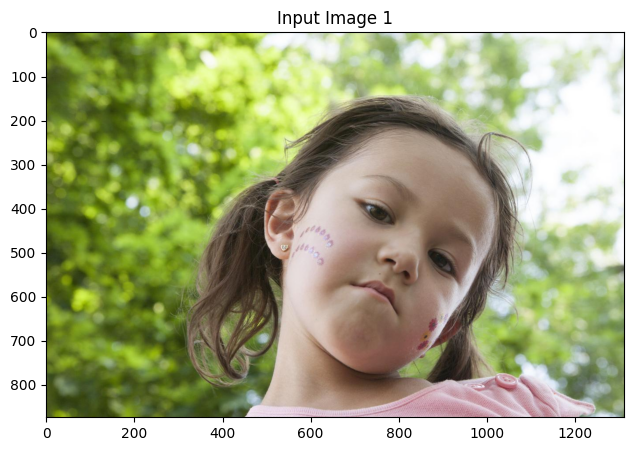

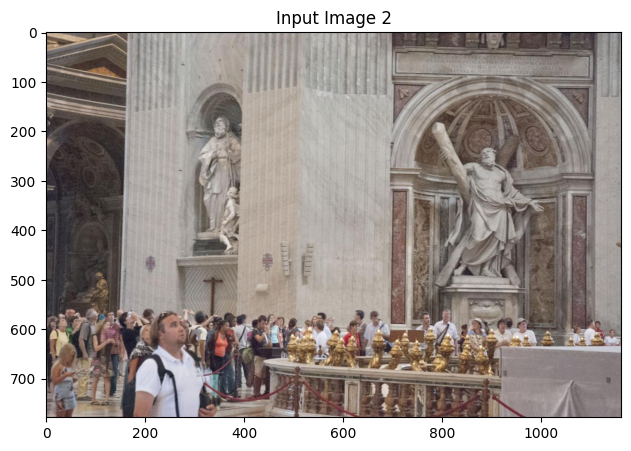

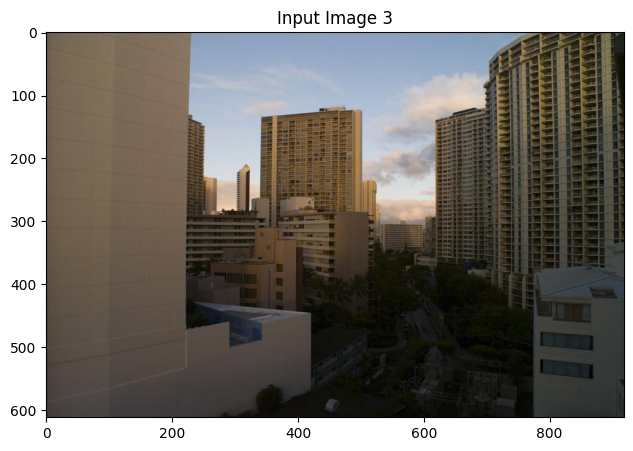

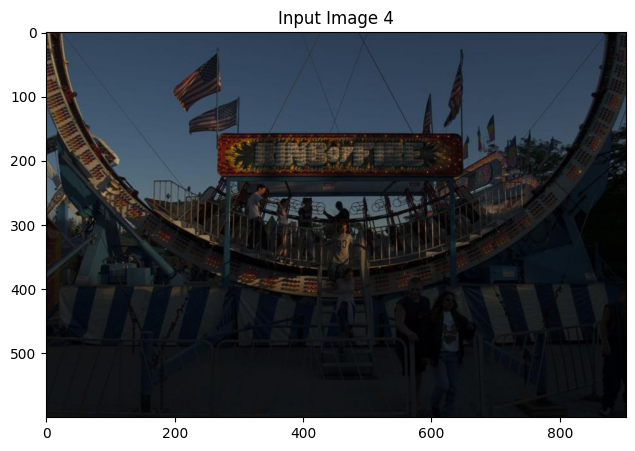

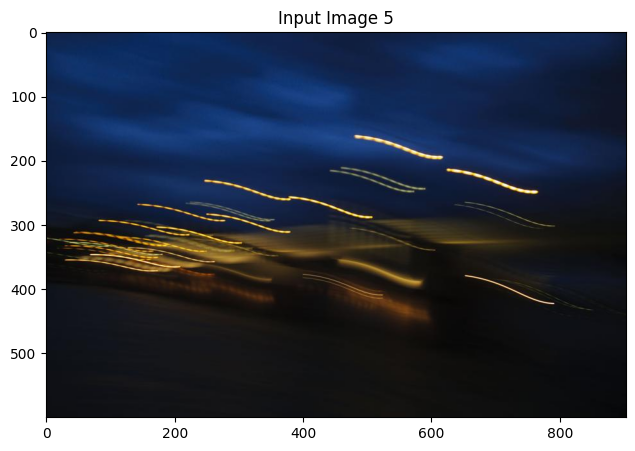

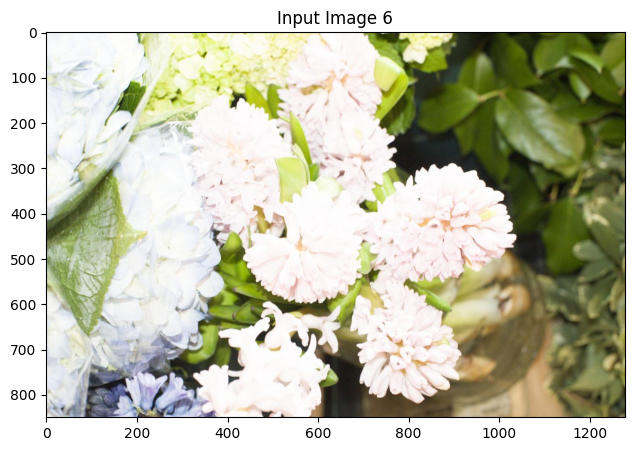

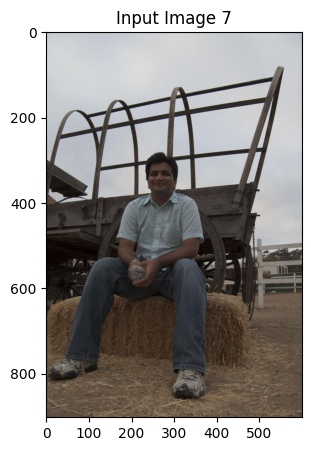

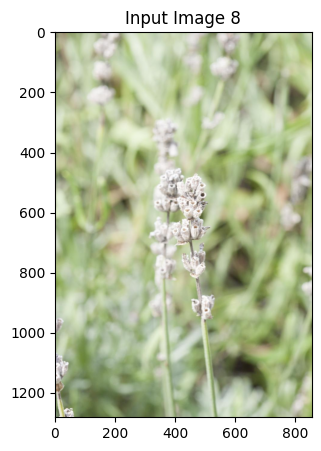

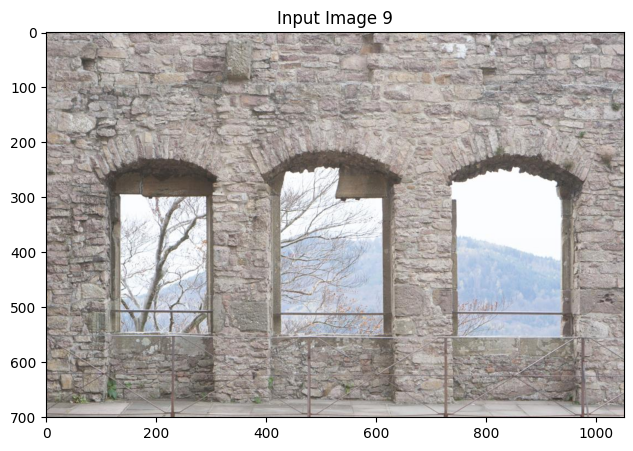

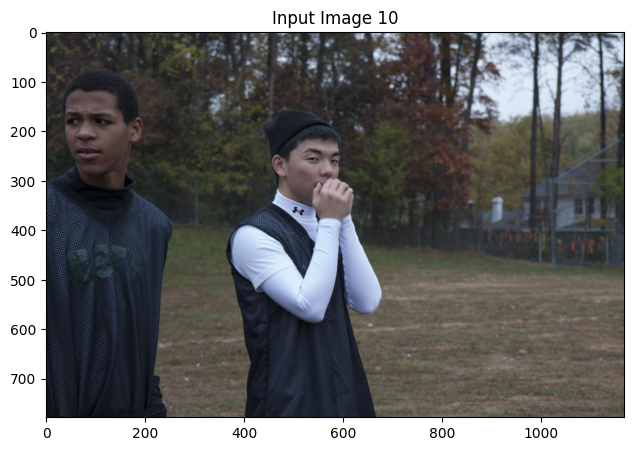

In [12]:
# Get the top 10 image filenames from each directory
training_IN_top10 = training_IN[10:]
#training_GT_top10 = training_GT[:10]

# Print the images in pairs
for i in range(10):

  input_img = mpimg.imread(os.path.join("/content/training/INPUT_IMAGES", training_IN_top10[i]))
  #gt_img = mpimg.imread(os.path.join("/content/training/GT_IMAGES", training_GT_top10[i]))

  # Display the images
  plt.figure(figsize=(10, 5))
  #plt.subplot(1, 2, 1)
  plt.imshow(input_img)
  plt.title(f"Input Image {i+1}")
  #plt.subplot(1, 2, 2)
  #plt.title(f"GT Image {i+1}")
  #plt.imshow(gt_img)
  #plt.show()
  print()

applying histogram equilisation

In [15]:
def hist_equlisation(img):
  # Convert the image to grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Apply histogram equalization
  equ = cv2.equalizeHist(gray)

  return equ

In [22]:
def apply_gray(img):
 gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

 return gray

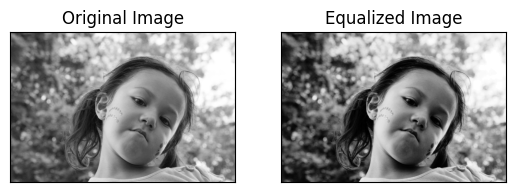

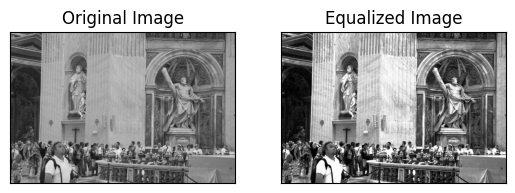

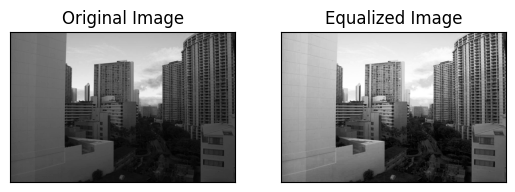

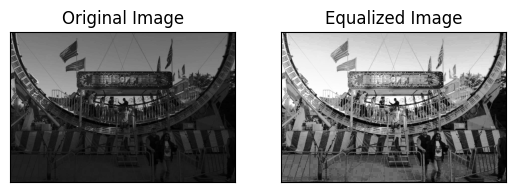

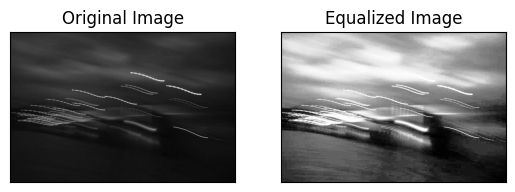

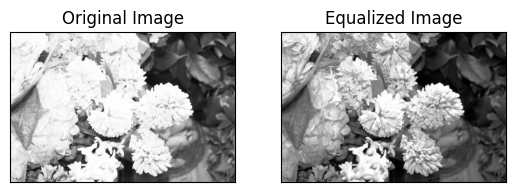

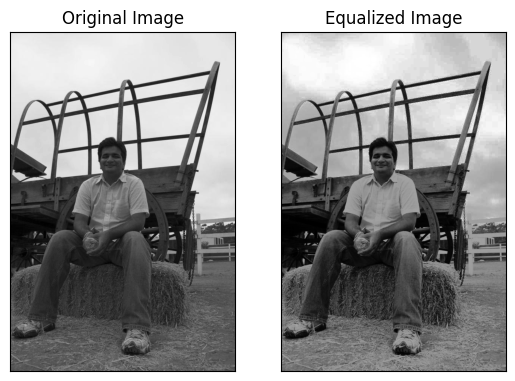

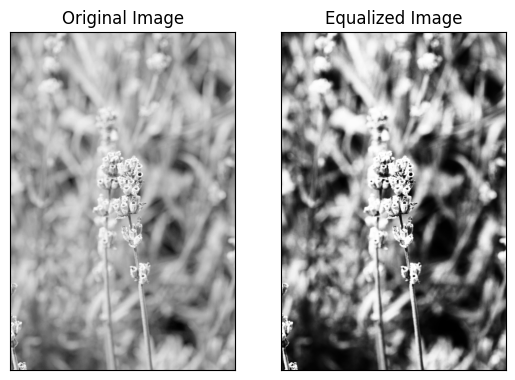

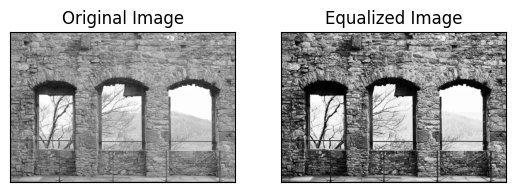

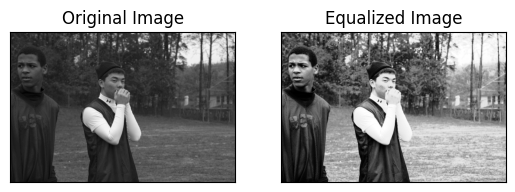

In [35]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

training_IN_top10 = training_IN[10:]

# Print the images in pairs
for i in range(10):

  # Load the image
  img = mpimg.imread(os.path.join("/content/training/INPUT_IMAGES", training_IN_top10[i]))

  # Convert the image to grayscale
  gray = apply_gray(img)

  #hitogram equilisation
  equ = hist_equlisation(img)

  # Show the original and equalized images
  plt.subplot(121), plt.imshow(gray, cmap='gray')
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(equ, cmap='gray')
  plt.title('Equalized Image'), plt.xticks([]), plt.yticks([])
  plt.show()


In [57]:
def hist_histequ(gray, equ, figsize=(10, 5)):
  """
  Plots two images side-by-side with their corresponding histograms.

  Args:
      gray: The original image (numpy array).
      equ: The processed image (numpy array).
      figsize: The desired figure size (tuple).

  Returns:
      None
  """

  # Ensure histograms have the same length
  if len(gray.ravel()) != len(equ.ravel()):
      raise ValueError("Images must have the same dimensions.")

  # Calculate histograms
  gray_hist, _ = np.histogram(gray.ravel(), bins=256)
  equ_hist, _ = np.histogram(equ.ravel(), bins=256)

  # Create the figure and subplots
  fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10, 8))

  # Plot image1
  ax1[0].imshow(gray, cmap='gray')
  ax1[0].set_title('Gray')
  ax1[0].axis('off')

  # Plot image2
  ax1[1].imshow(equ, cmap='gray')
  ax1[1].set_title('equ')
  ax1[1].axis('off')

  # Plot histograms below images (adjust spacing as needed)
  ax2[0].plot(gray_hist, label='Image 1', alpha=0.7)
  ax2[0].set_xlabel("Pixel Intensity")
  ax2[0].set_ylabel("Number of Pixels")
  ax2[0].legend()
  ax2[0].tick_params(bottom=False)

  ax2[1].plot(equ_hist, label='equ', alpha=0.7)
  ax2[1].set_xlabel("Pixel Intensity")
  ax2[1].set_ylabel("Number of Pixels")
  ax2[1].legend()
  ax2[1].tick_params(bottom=False)

  # Adjust spacing and layout
  plt.tight_layout()
  plt.show()

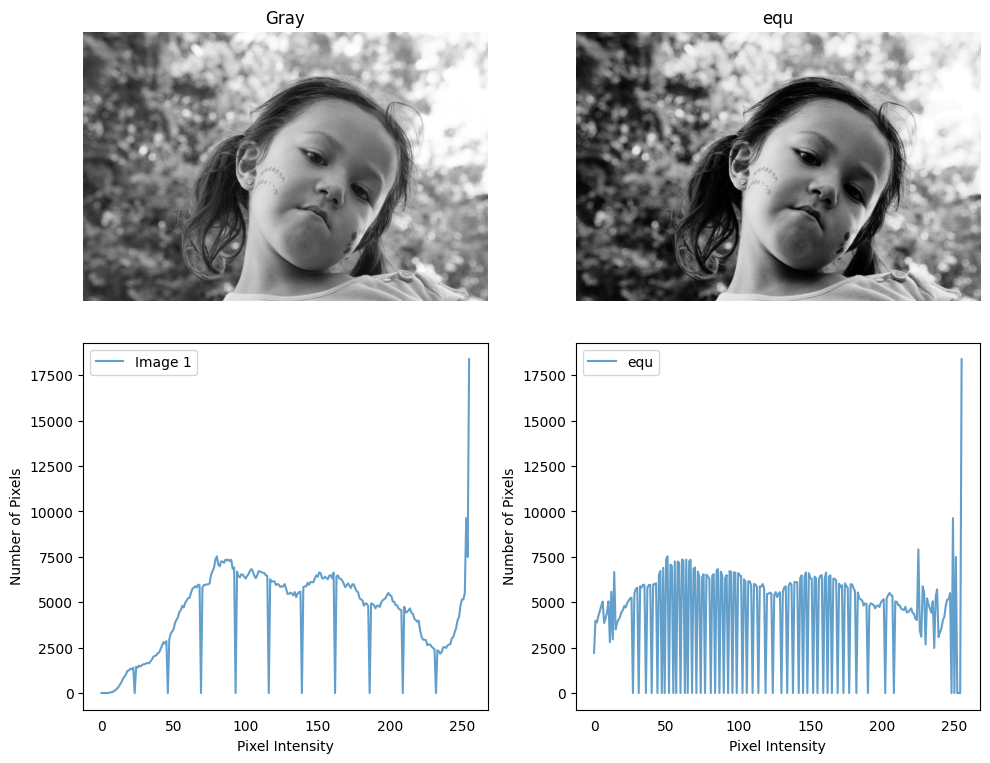

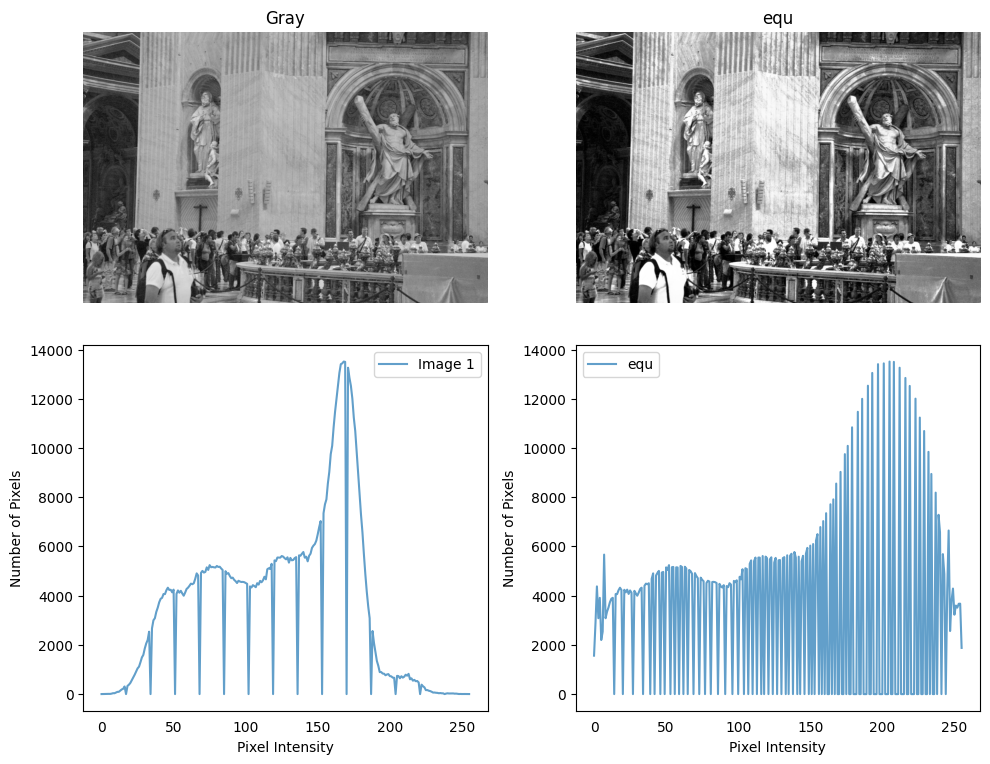

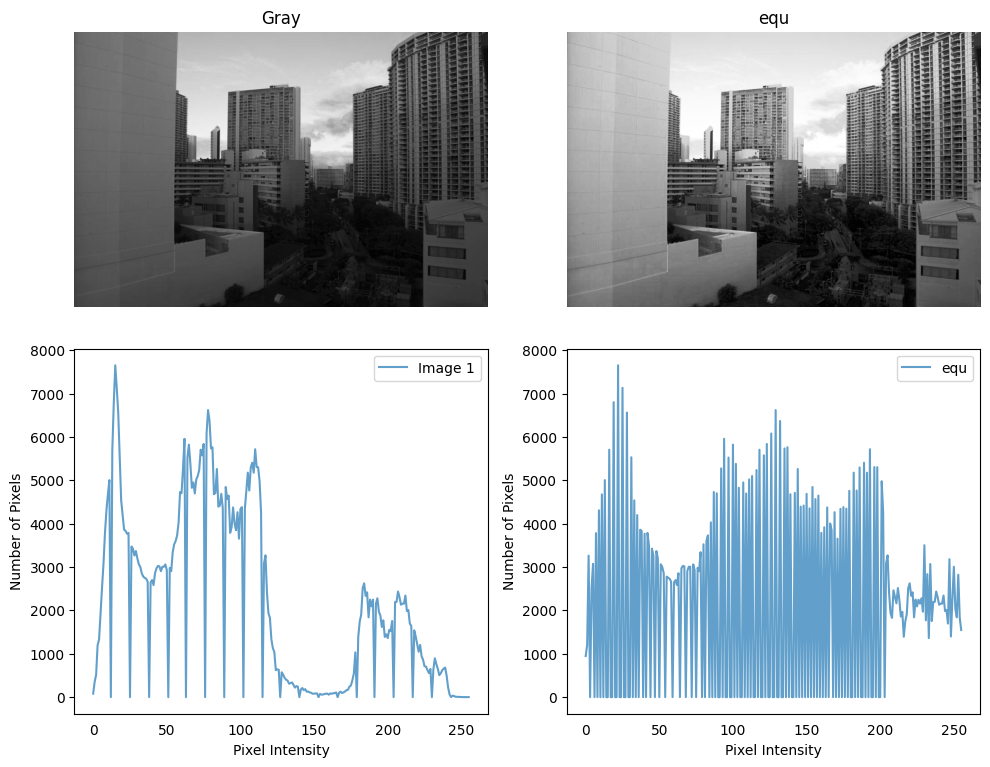

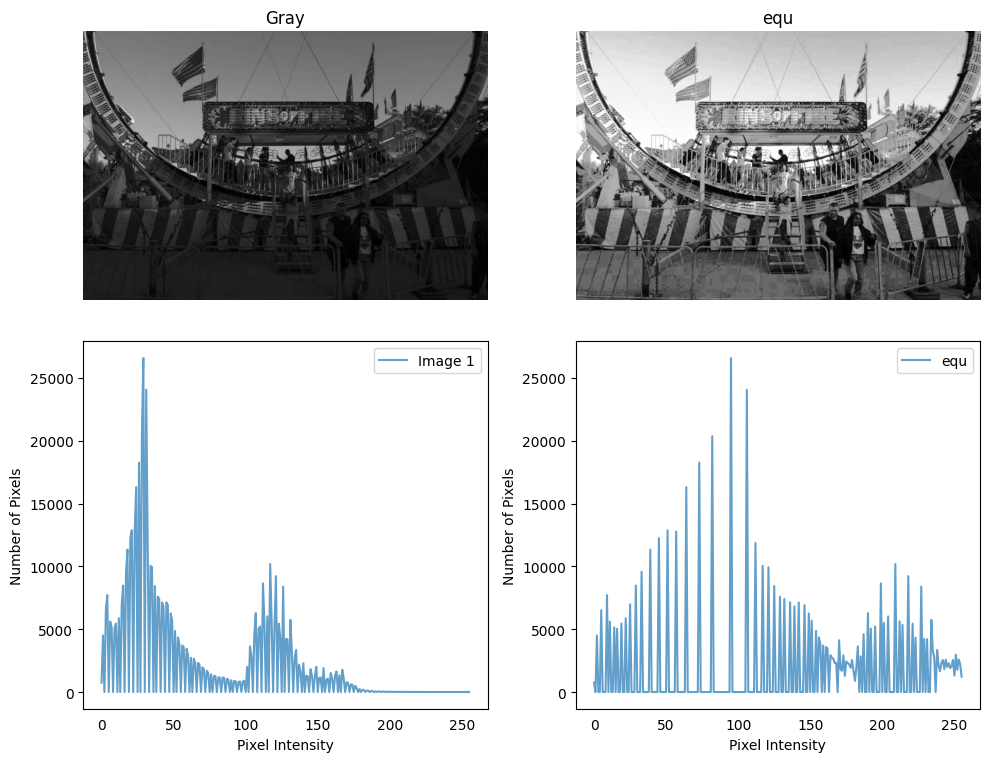

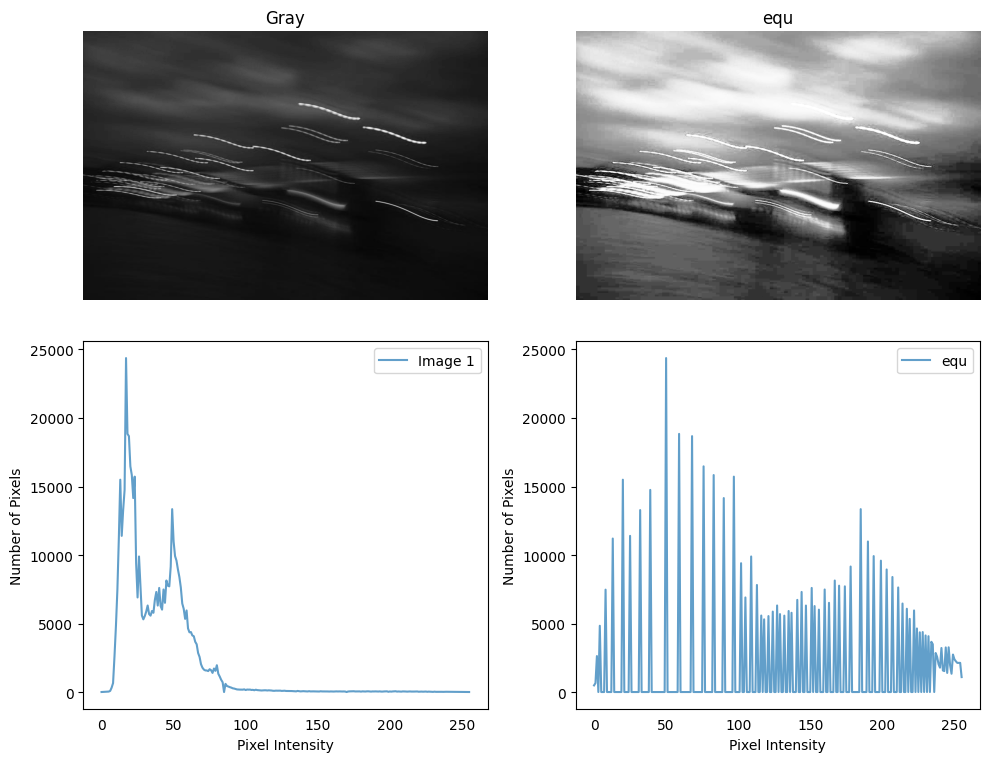

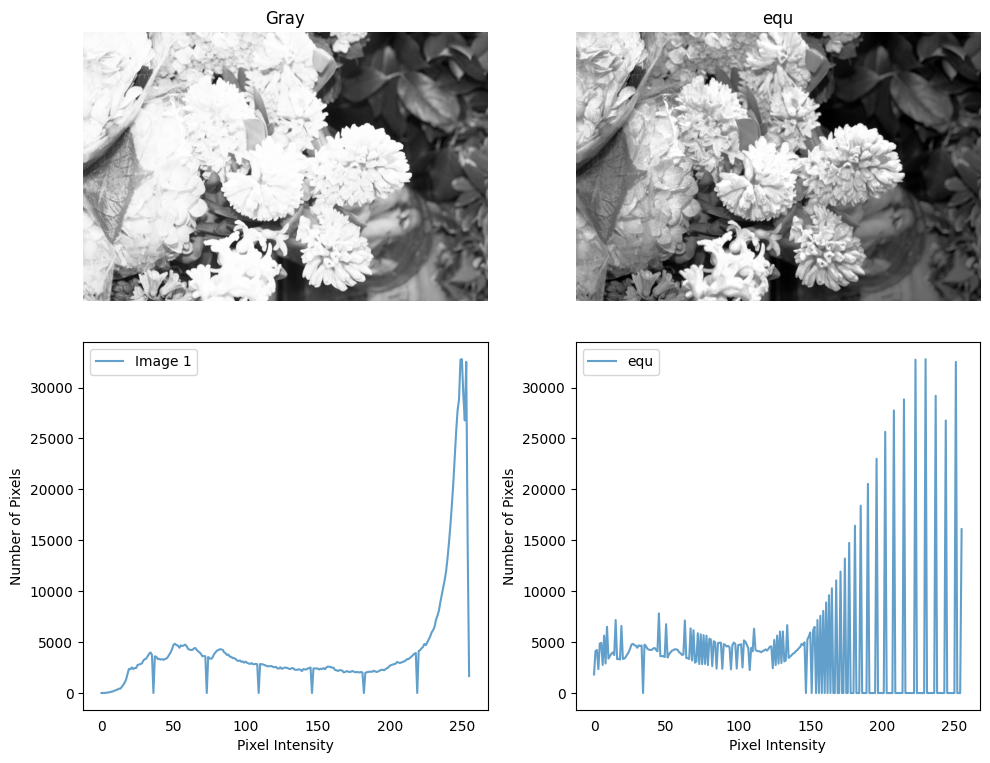

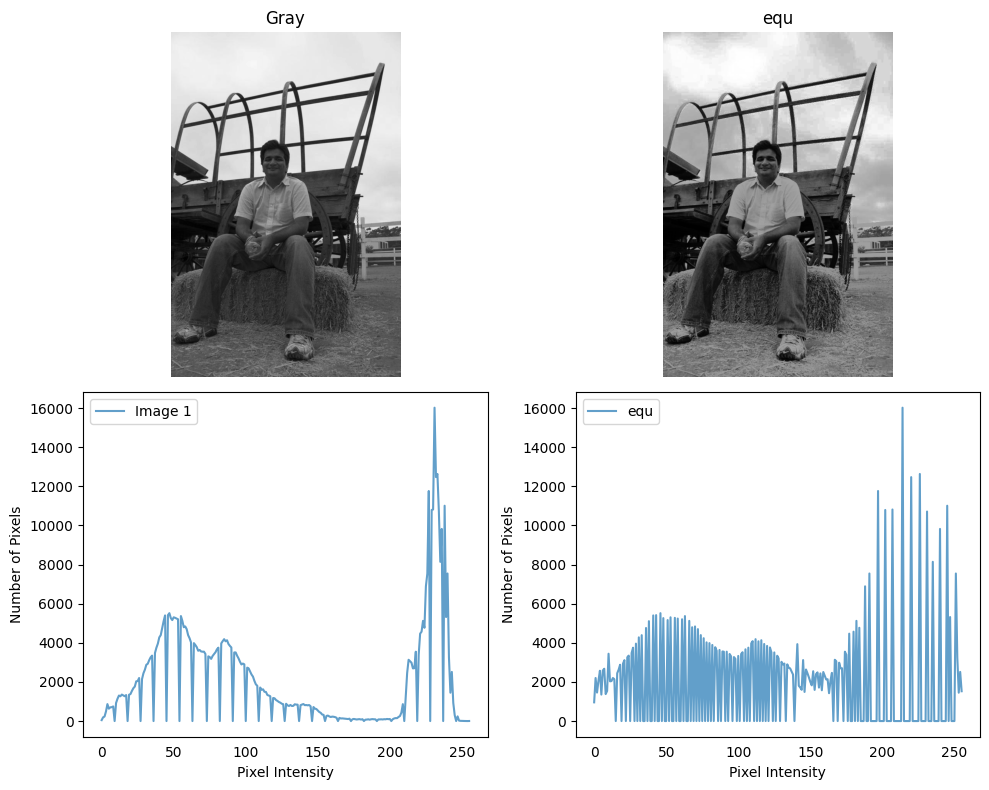

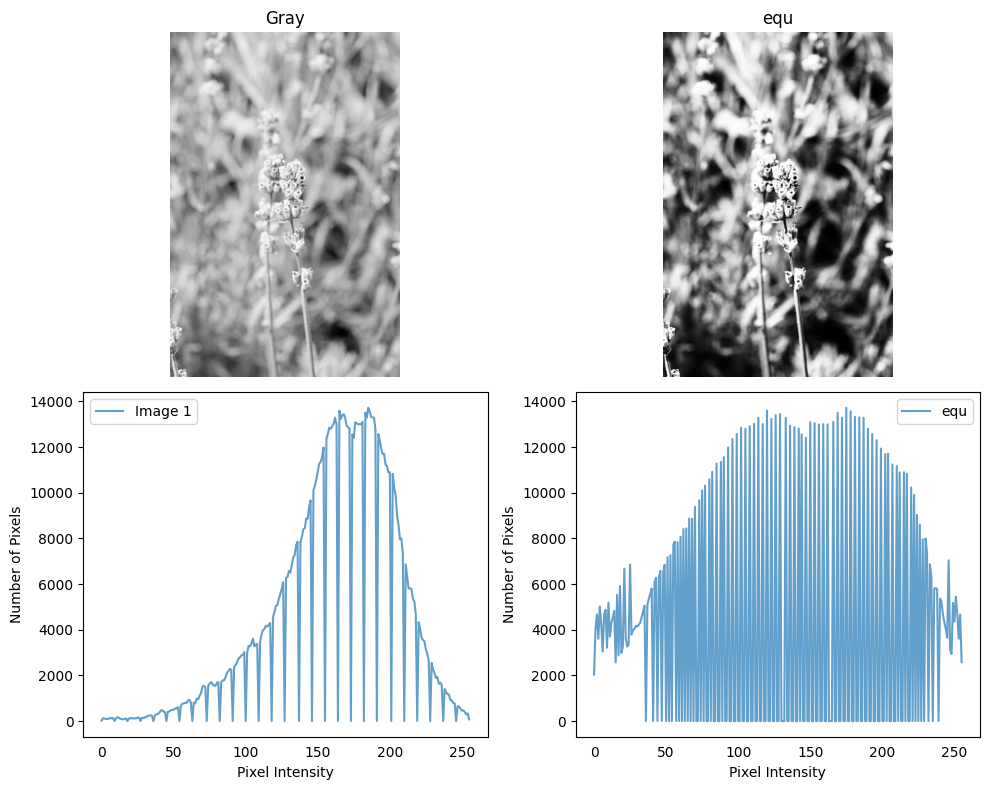

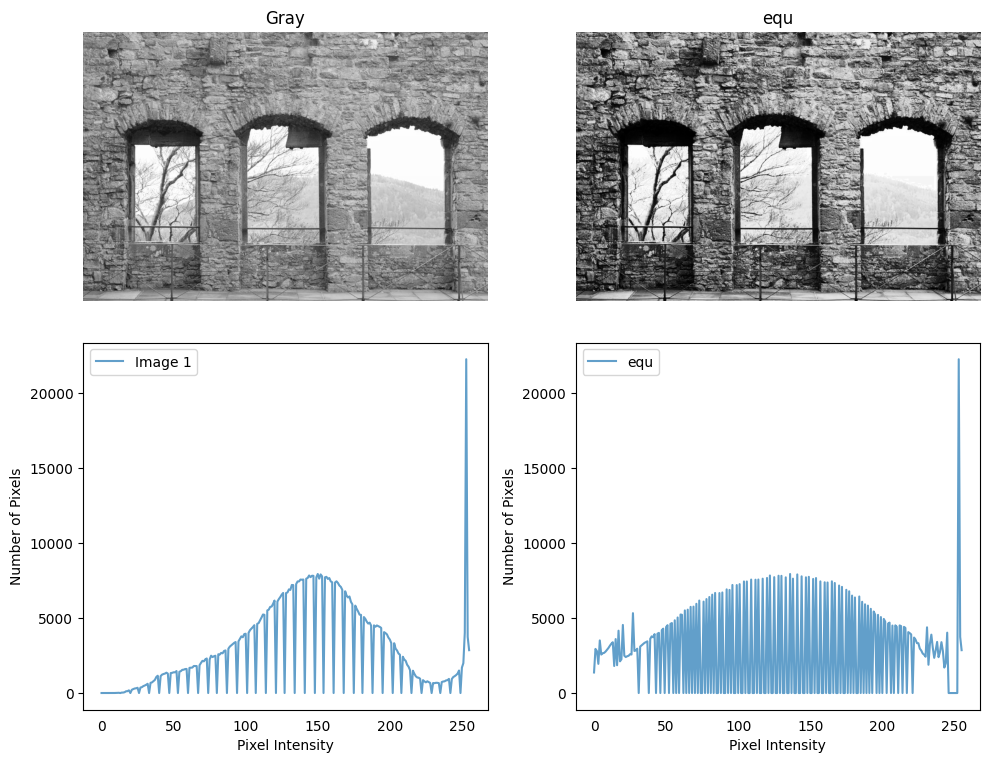

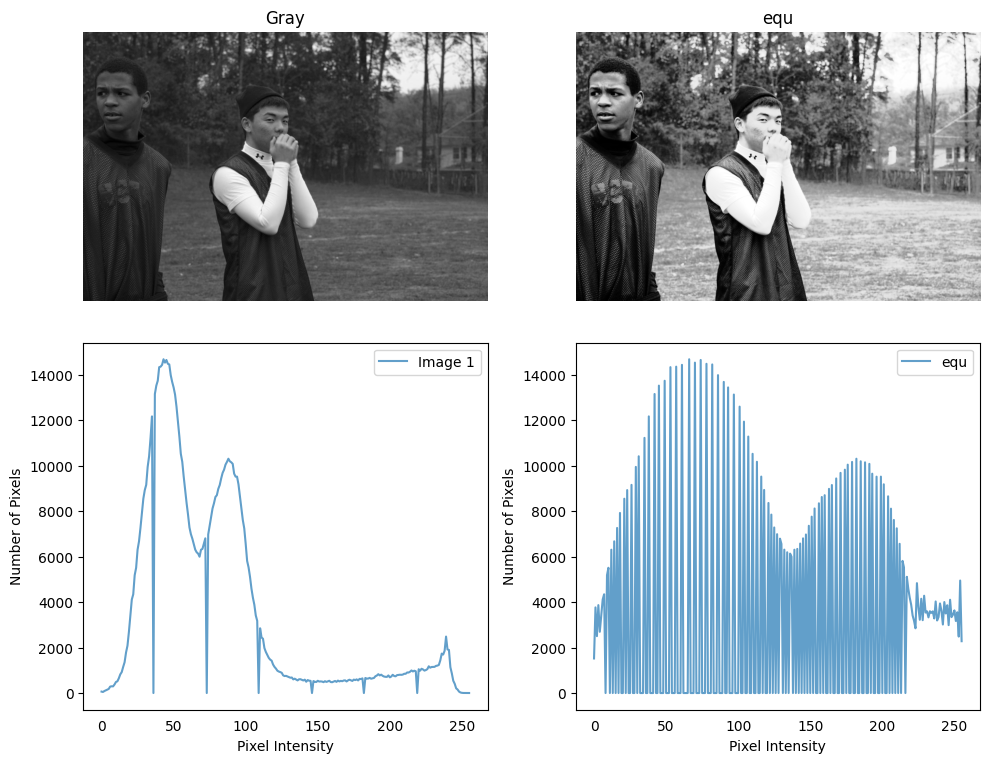

In [58]:
training_IN_top10 = training_IN[10:]

# Print the images in pairs
for i in range(10):

  # Load the image
  img = mpimg.imread(os.path.join("/content/training/INPUT_IMAGES", training_IN_top10[i]))

  # Convert the image to grayscale
  gray = apply_gray(img)

  #hitogram equilisation
  equ = hist_equlisation(img)

  hist_histequ(gray,equ)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from cv2 import createCLAHE


In [20]:
def apply_clahe(img, clipLimit=2.0, tileGridSize=(8, 8)):
    """Applies CLAHE (Contrast-Limited Adaptive Histogram Equalization) to an image.

    Args:
        img: Input image as a NumPy array.
        clipLimit: Limit for contrast amplification (default: 2.0).
        tileGridSize: Size of the grid for local histogram calculations (default: (8, 8)).

    Returns:
        CLAHE-enhanced image as a NumPy array.
    """
    if len(img.shape) == 3:  # Check if RGB or BGR
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Create the CLAHE object here before calling it
        clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
        enhanced_img = clahe.apply(gray)
        return cv2.cvtColor(enhanced_img, cv2.COLOR_GRAY2BGR)
    else:  # Assume grayscale
        clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
        return clahe.apply(img)


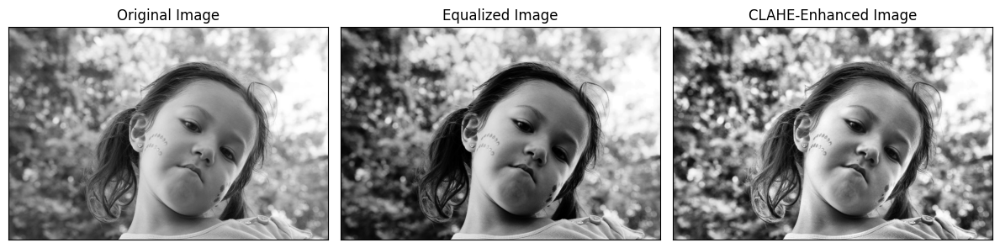

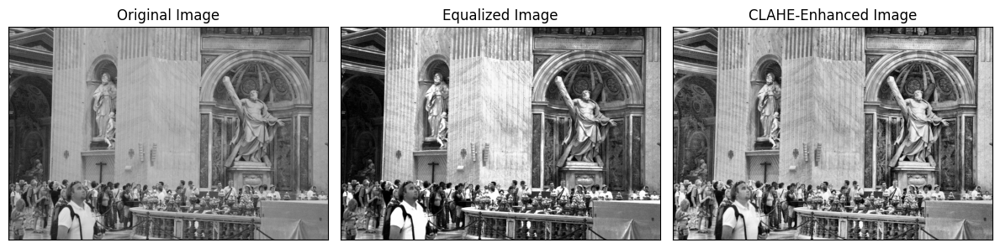

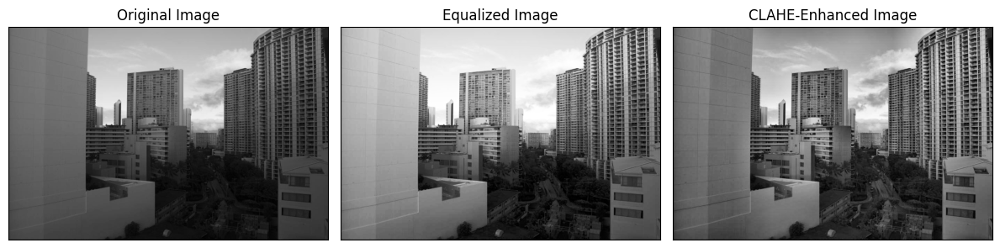

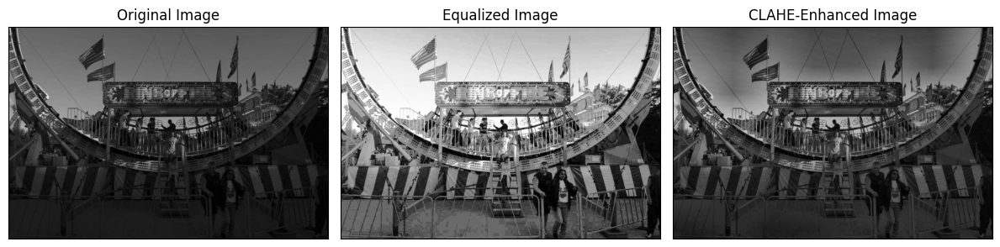

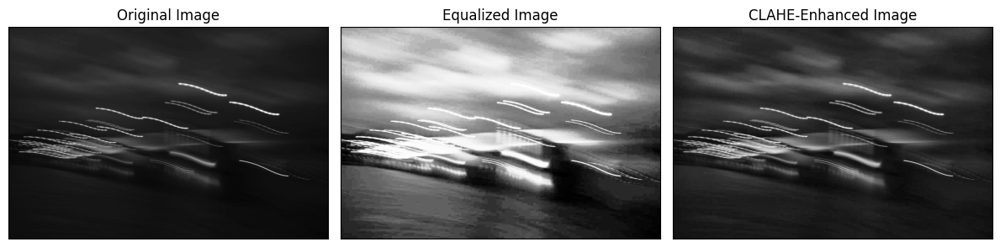

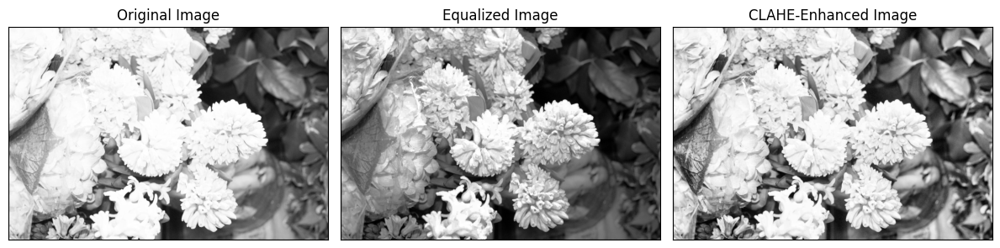

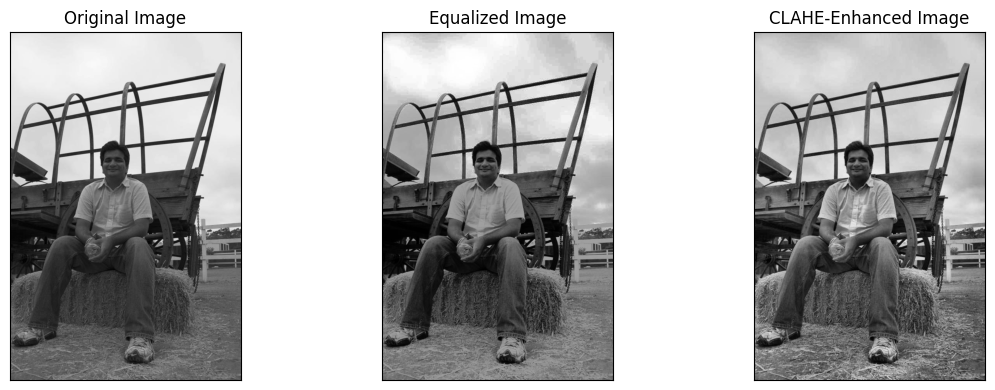

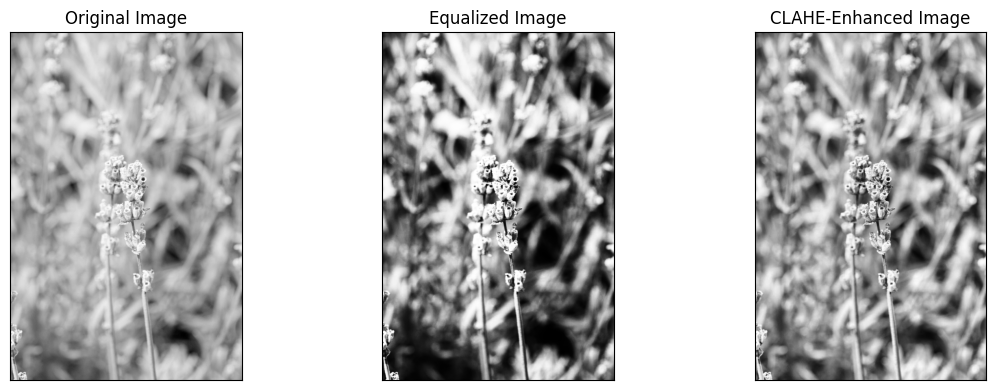

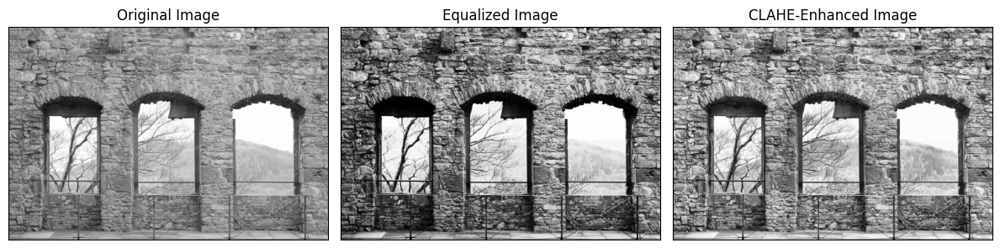

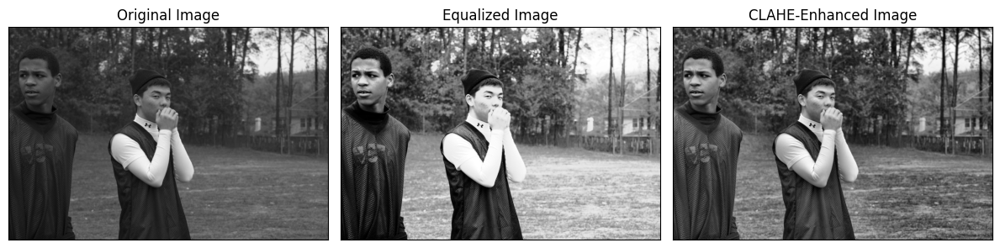

In [30]:
for i in range(10):
    img = cv2.imread(os.path.join("/content/training/INPUT_IMAGES", training_IN_top10[i]))
    gray = apply_gray(img)
    equ = hist_equlisation(img)
    clahe_img = apply_clahe(img)

    # Plot the images side-by-side
    plt.figure(figsize=(12, 4))

    plt.subplot(131), plt.imshow(gray, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(132), plt.imshow(equ, cmap='gray')
    plt.title('Equalized Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(133), plt.imshow(clahe_img, cmap='gray')
    plt.title('CLAHE-Enhanced Image'), plt.xticks([]), plt.yticks([])

    plt.tight_layout()
    plt.show()


In [80]:
def hist_clahe(gray, clahe, figsize=(10, 5)):
  """
  Plots two images side-by-side with their corresponding histograms.

  Args:
      gray: The original image (numpy array).
      clahe: The processed image (numpy array).
      figsize: The desired figure size (tuple).

  Returns:
      None
  """

  # Ensure histograms have the same length
  #if len(gray.ravel()) != len(clahe.ravel()):
  #    raise ValueError("Images must have the same dimensions.")

  # Calculate histograms
  gray_hist, _ = np.histogram(gray.ravel(), bins=256)
  clahe_hist, _ = np.histogram(clahe.ravel(), bins=256)

  # Create the figure and subplots
  fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10, 8))

  # Plot image1
  ax1[0].imshow(gray, cmap='gray')
  ax1[0].set_title('Gray')
  ax1[0].axis('off')

  # Plot image2
  ax1[1].imshow(clahe, cmap='gray')
  ax1[1].set_title('clahe')
  ax1[1].axis('off')

  # Plot histograms below images (adjust spacing as needed)
  ax2[0].plot(gray_hist, label='Image 1', alpha=0.7)
  ax2[0].set_xlabel("Pixel Intensity")
  ax2[0].set_ylabel("Number of Pixels")
  ax2[0].legend()
  ax2[0].tick_params(bottom=False)

  ax2[1].plot(clahe_hist, label='clahe', alpha=0.7)
  ax2[1].set_xlabel("Pixel Intensity")
  ax2[1].set_ylabel("Number of Pixels")
  ax2[1].legend()
  ax2[1].tick_params(bottom=False)

  # Adjust spacing and layout
  plt.tight_layout()
  plt.show()

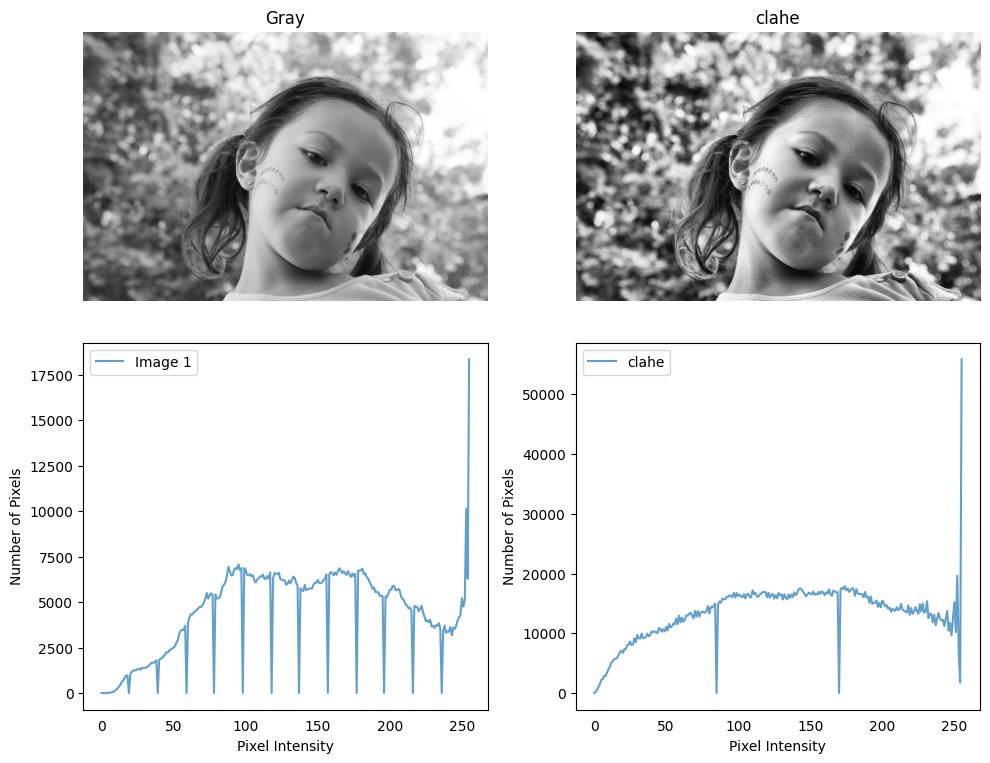

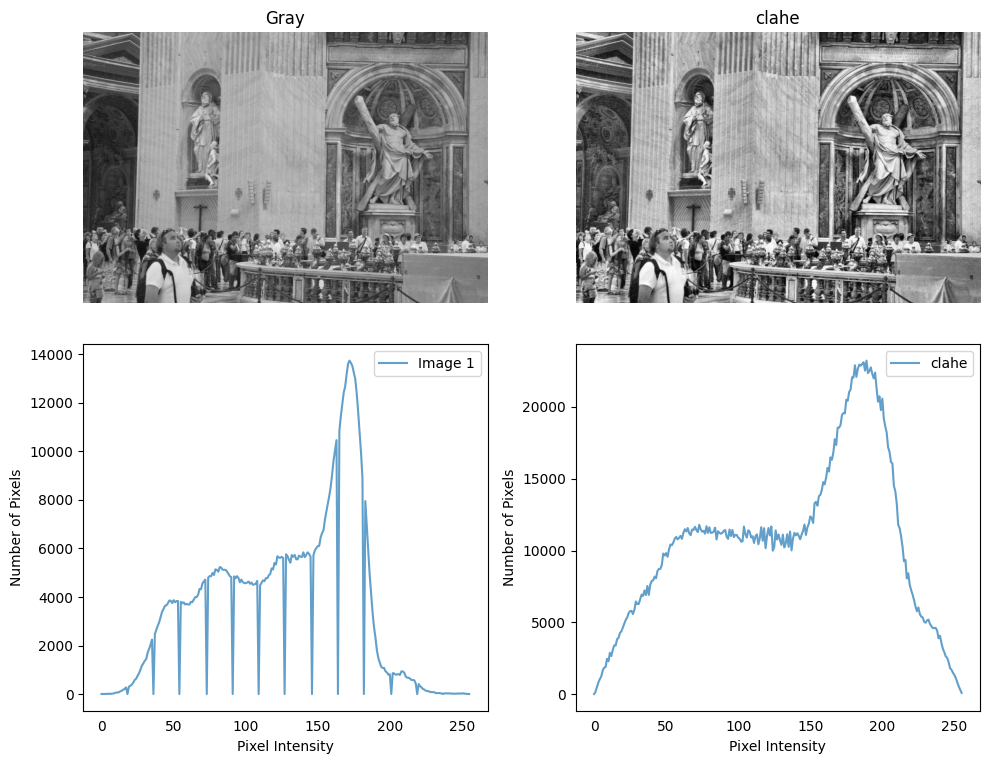

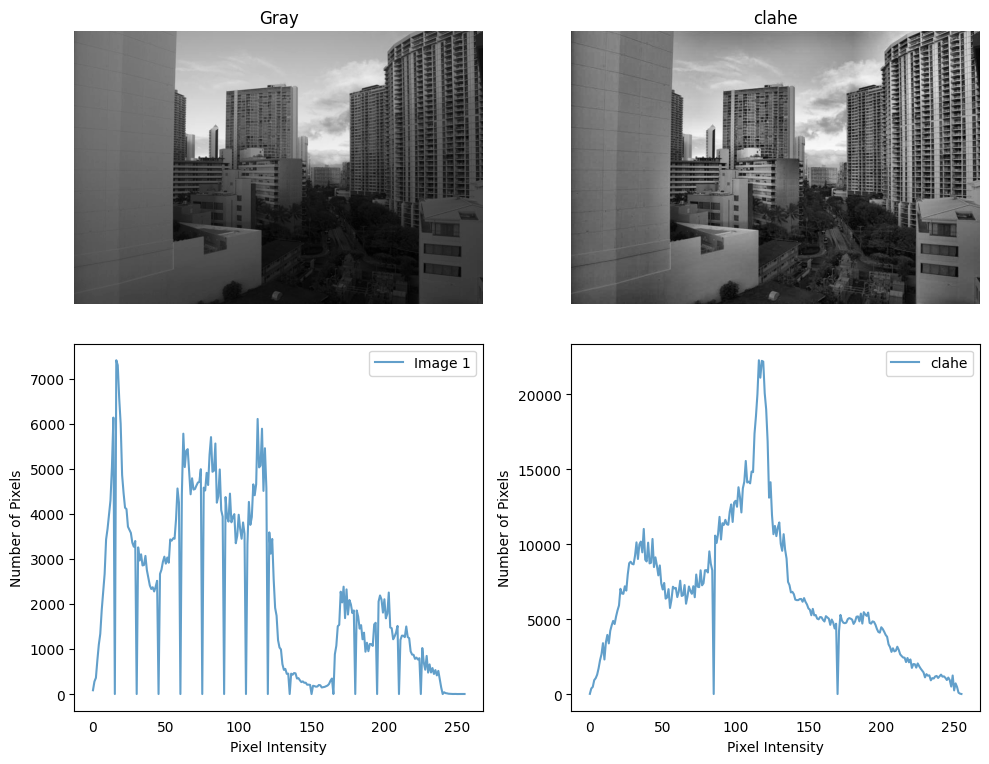

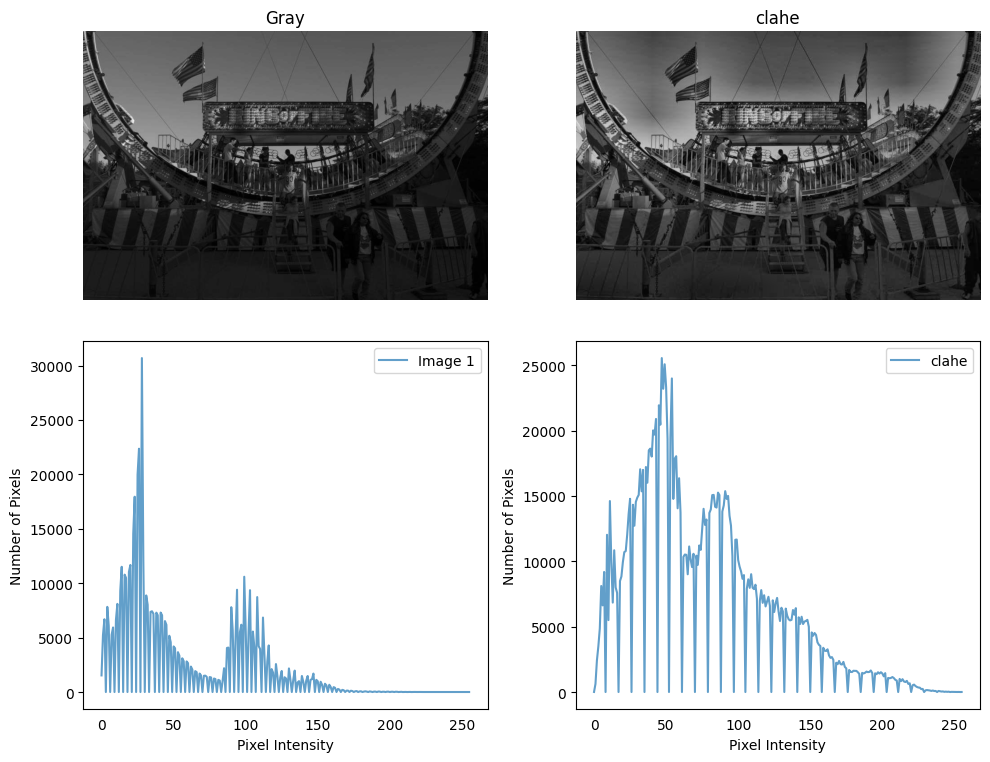

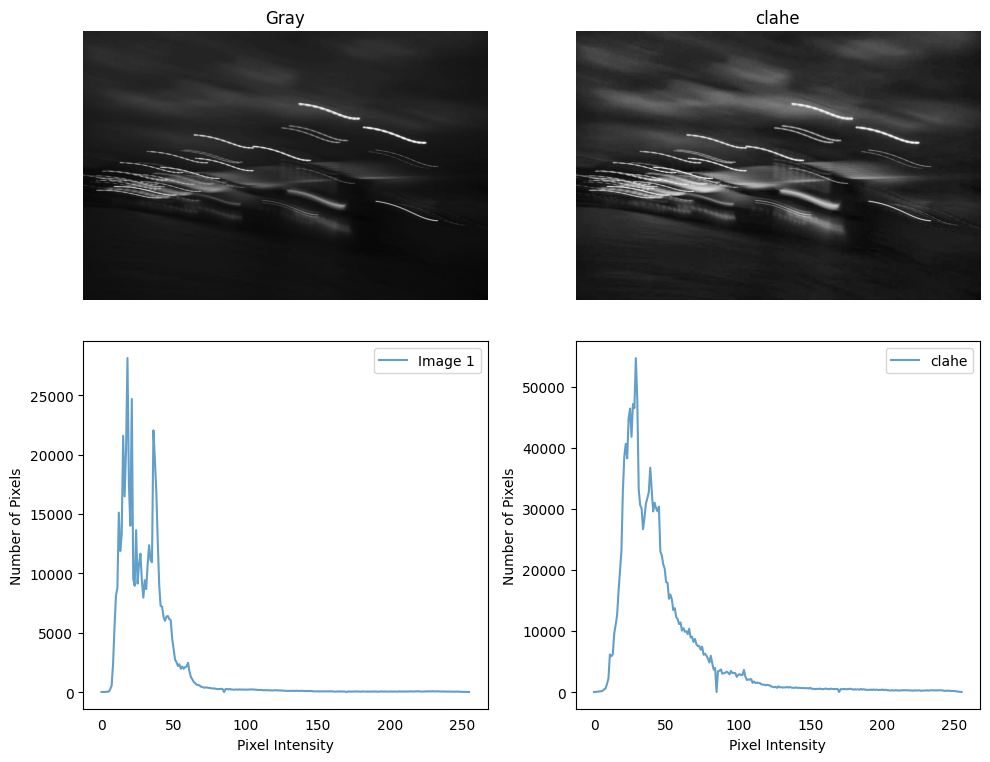

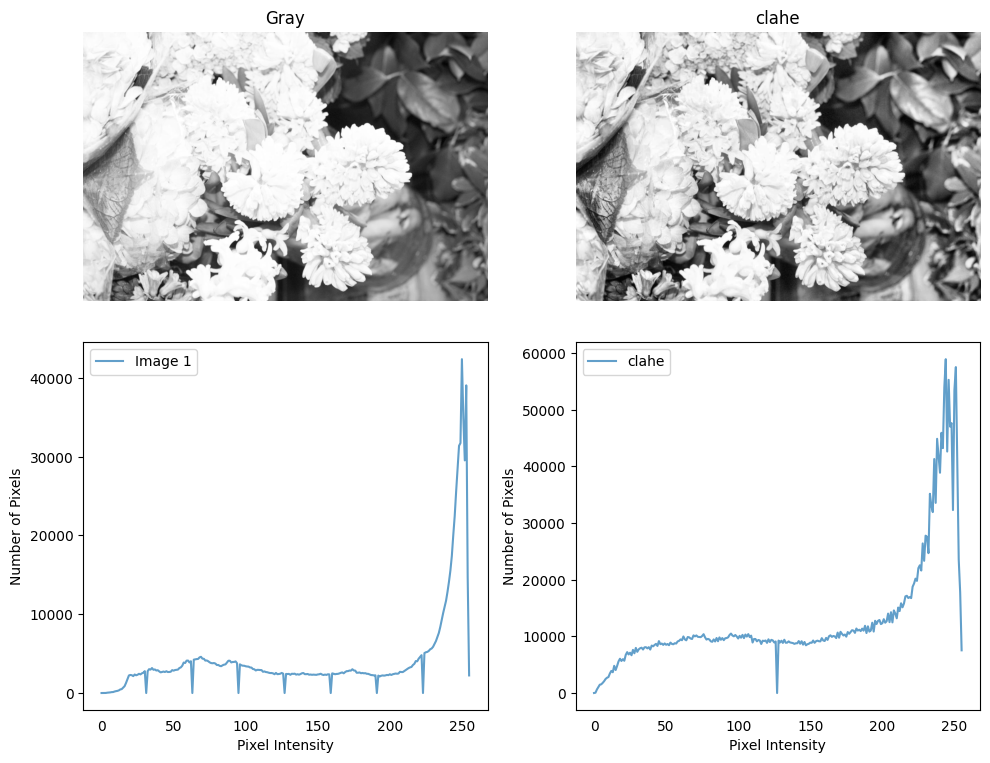

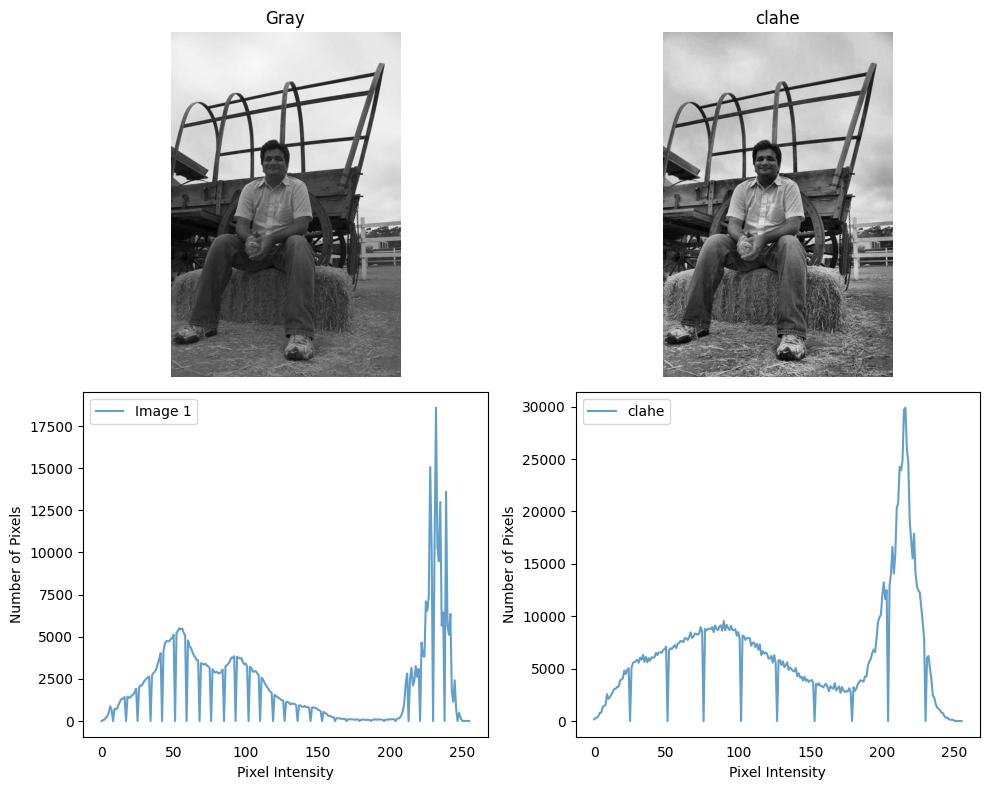

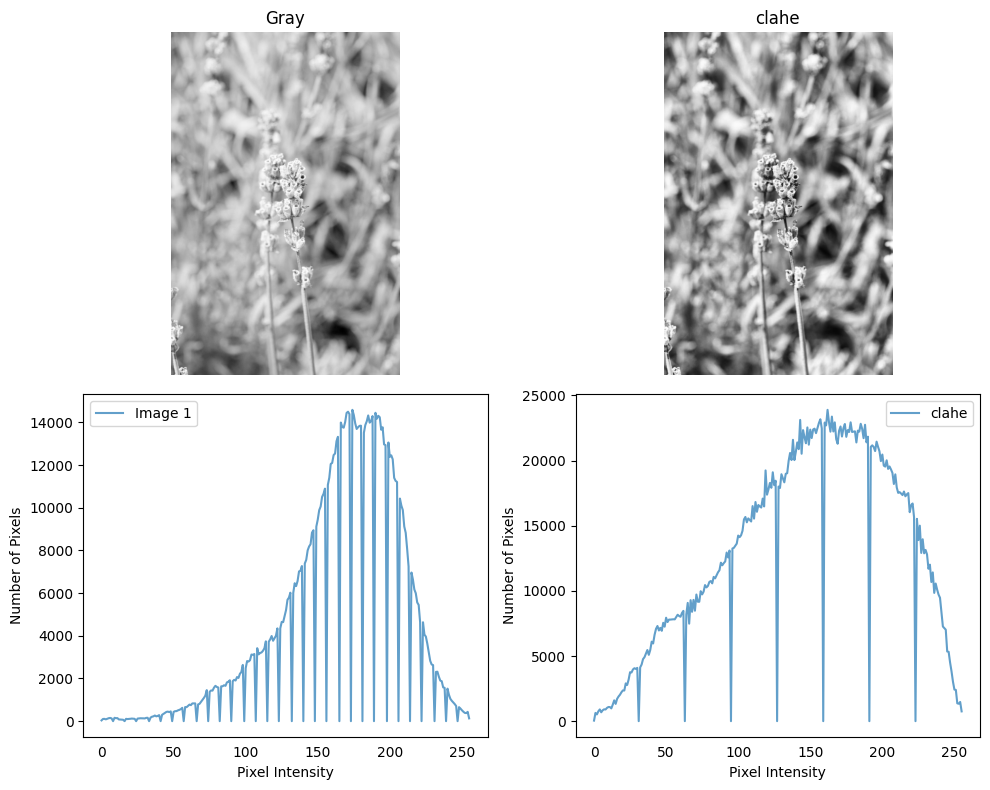

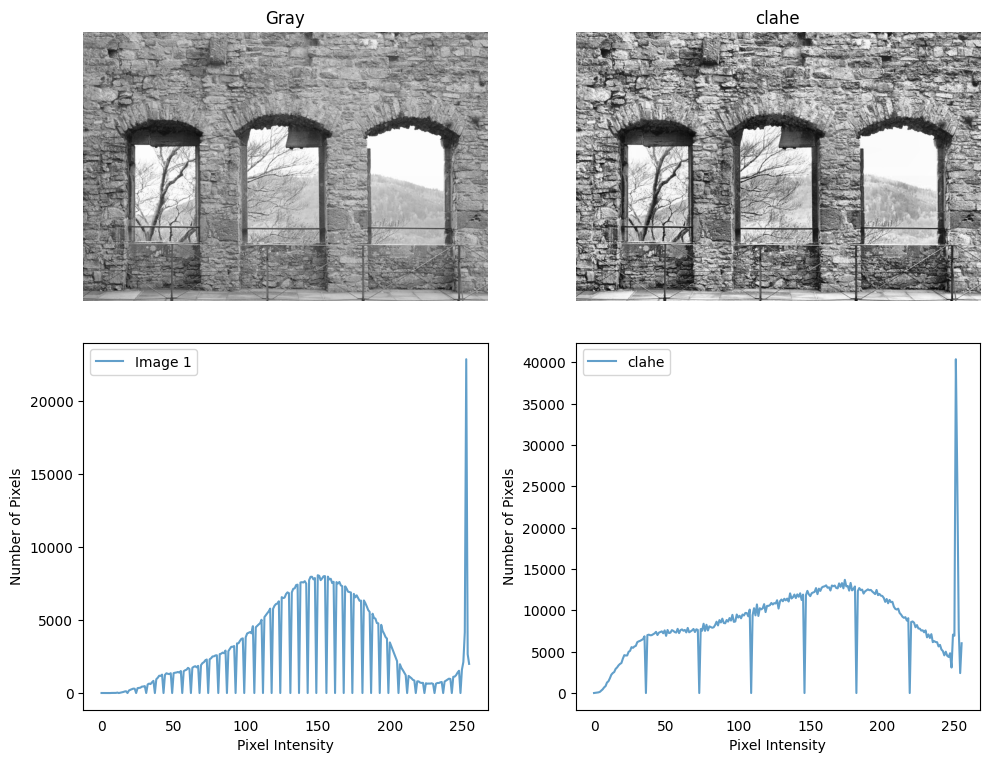

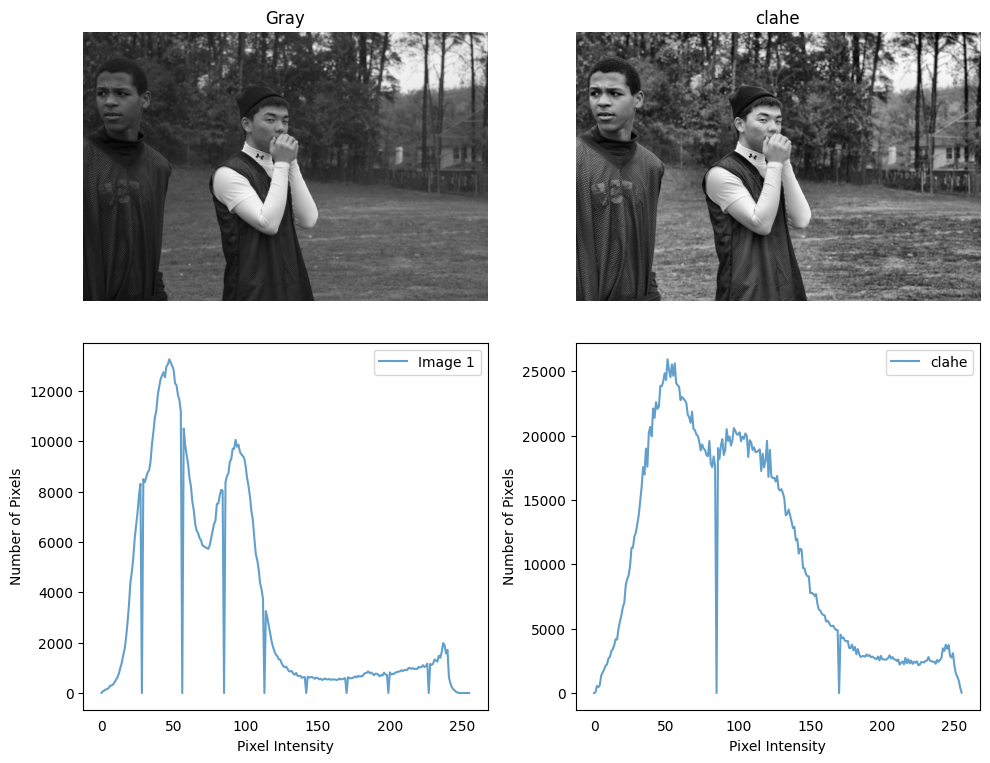

In [83]:
for i in range(10):
    img = cv2.imread(os.path.join("/content/training/INPUT_IMAGES", training_IN_top10[i]))
    gray = apply_gray(img)
    equ = hist_equlisation(img)
    clahe = apply_clahe(img)

    hist_clahe(gray,clahe)